In [1]:
import Pkg 
Pkg.activate("../../.")
include("ComputeModeUncert.jl");
using Base.Threads
using StatsPlots
using Statistics

  Activating project at `~/Desktop/QuantumInspiredML`


# Legendre Mean Uncertainty

In [2]:
ds = 3:20
eval_pts = 3000
err_matrix = Matrix{Float64}(undef, length(ds), eval_pts)
for (i, d) in enumerate(ds)
    println("Evaluating d=$d...")
    err_matrix[i, :] = encoding_mean_uncertainty(:Legendre_No_Norm, d; num_eval_pts=eval_pts)
end

Evaluating d=3...
Evaluating d=4...
Evaluating d=5...
Evaluating d=6...
Evaluating d=7...
Evaluating d=8...
Evaluating d=9...
Evaluating d=10...
Evaluating d=11...
Evaluating d=12...
Evaluating d=13...
Evaluating d=14...
Evaluating d=15...
Evaluating d=16...
Evaluating d=17...
Evaluating d=18...
Evaluating d=19...
Evaluating d=20...


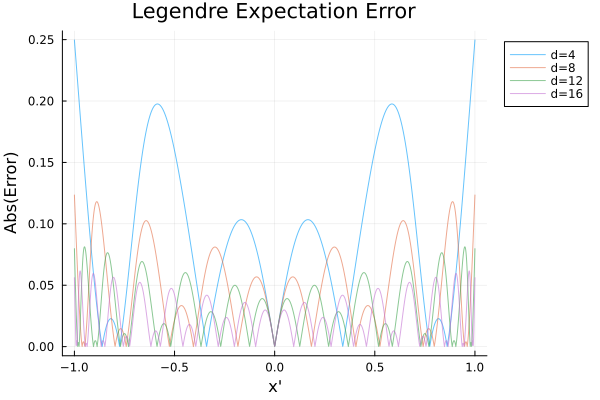

In [3]:
xprs = LinRange(-1, 1, eval_pts)
plot(xprs, err_matrix[2, :], label="d=4", legend=:outertopright, 
    xlabel="x'", ylabel="Abs(Error)", alpha=0.6, title="Legendre Expectation Error")
plot!(xprs, err_matrix[6, :], label="d=8", alpha=0.6)
plot!(xprs, err_matrix[10, :], label="d=12", alpha=0.6)
plot!(xprs, err_matrix[14, :], label="d=16", alpha=0.6)

In [91]:
# set the cmap range based on max error across mode, mean, median
max_error = max(maximum(err_matrix_mode), maximum(err_matrix))
cmap = cgrad(:thermal)
fstyle = font("sans-serif", 23)

Plots.Font("sans-serif", 23, :hcenter, :vcenter, 0.0, RGB{N0f8}(0.0,0.0,0.0))

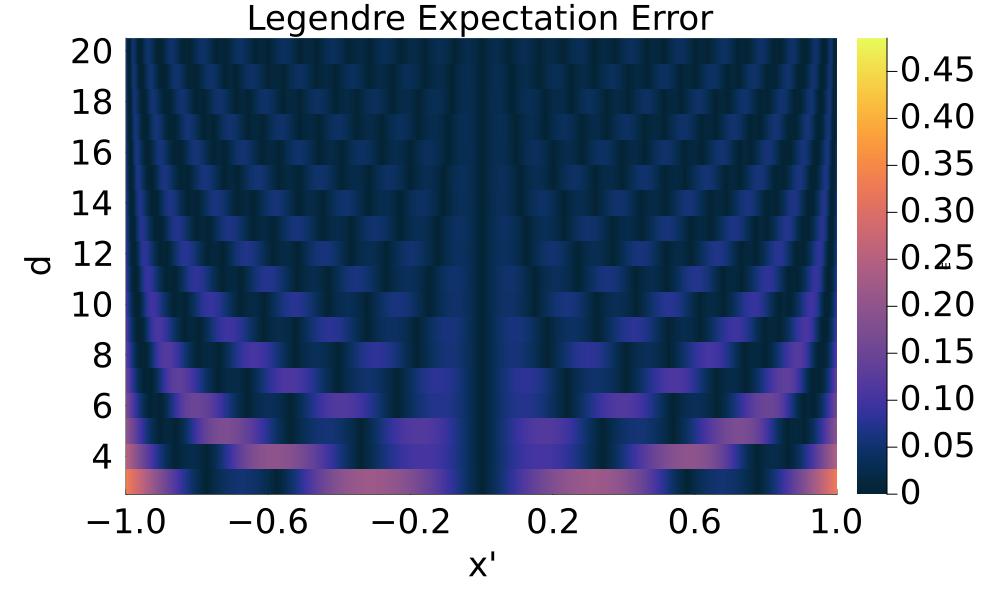

In [116]:
heatmap(xprs, collect(ds), err_matrix, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.4:1), title="Legendre Expectation Error",
        ylabel="d", xlabel="x'",xtickfont=fstyle, ytickfont=fstyle, 
        titlefont=fstyle, guidefont=fstyle,
        right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm,
        colorbar_title="ϵ")
#savefig("plots/legendre_expectation_abs_error.svg")

# Legendre Mode Uncertainty

In [5]:
ds = 3:20
eval_pts = 3000
err_matrix_mode = Matrix{Float64}(undef, length(ds), eval_pts)
for (i, d) in enumerate(ds)
    println("Evaluating d=$d...")
    err_matrix_mode[i, :] = encoding_mode_uncertainty(:Legendre_No_Norm, d; num_eval_pts=eval_pts)
end

Evaluating d=3...
Evaluating d=4...
Evaluating d=5...
Evaluating d=6...
Evaluating d=7...
Evaluating d=8...
Evaluating d=9...
Evaluating d=10...
Evaluating d=11...
Evaluating d=12...
Evaluating d=13...
Evaluating d=14...
Evaluating d=15...
Evaluating d=16...
Evaluating d=17...
Evaluating d=18...
Evaluating d=19...
Evaluating d=20...


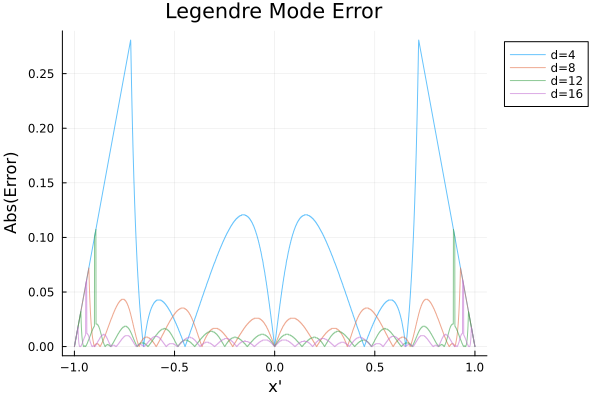

In [6]:
xprs = LinRange(-1, 1, eval_pts)
plot(xprs, err_matrix_mode[2, :], label="d=4", legend=:outertopright, 
    xlabel="x'", ylabel="Abs(Error)", alpha=0.6, title="Legendre Mode Error")
plot!(xprs, err_matrix_mode[6, :], label="d=8", alpha=0.6)
plot!(xprs, err_matrix_mode[10, :], label="d=12", alpha=0.6)
plot!(xprs, err_matrix_mode[14, :], label="d=16", alpha=0.6)

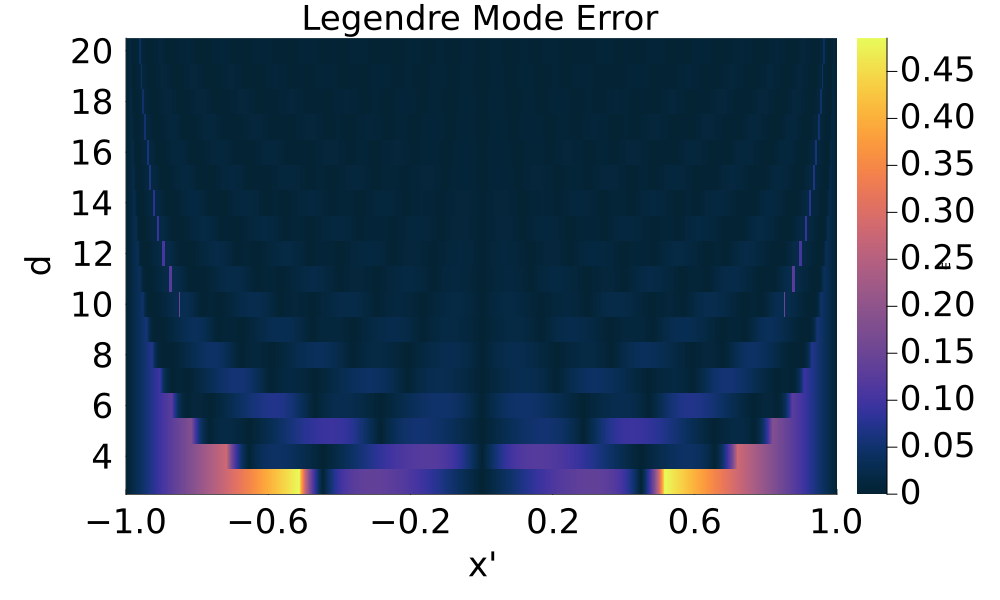

In [120]:
heatmap(xprs, collect(ds), err_matrix_mode, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.4:1), title="Legendre Mode Error",
        ylabel="d", xlabel="x'", xtickfont=fstyle, ytickfont=fstyle, 
        titlefont=fstyle, guidefont=fstyle,
        right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm,
        colorbar_title="ϵ")
#savefig("legendre_mode_abs_error.svg")

# Legendre Median Uncertainty

In [7]:
ds = 3:20
eval_pts = 3000
err_matrix_median = Matrix{Float64}(undef, length(ds), eval_pts)
for (i, d) in enumerate(ds)
    println("Evaluating d=$d...")
    err_matrix_median[i, :] = encoding_median_uncertainty(:Legendre_No_Norm, d; num_eval_pts=eval_pts)
end

Evaluating d=3...
Evaluating d=4...
Evaluating d=5...
Evaluating d=6...
Evaluating d=7...
Evaluating d=8...
Evaluating d=9...
Evaluating d=10...
Evaluating d=11...
Evaluating d=12...
Evaluating d=13...
Evaluating d=14...
Evaluating d=15...
Evaluating d=16...
Evaluating d=17...
Evaluating d=18...
Evaluating d=19...
Evaluating d=20...


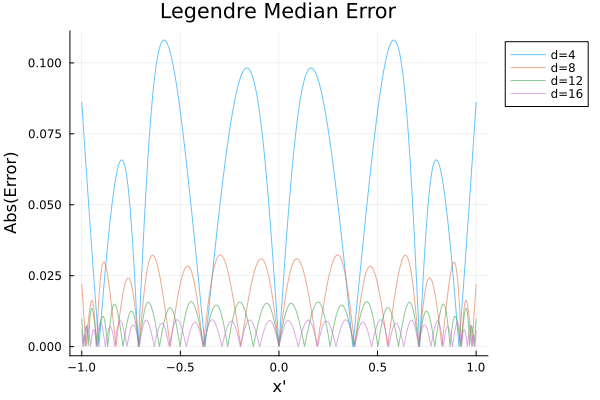

In [8]:
xprs = LinRange(-1, 1, eval_pts)
plot(xprs, err_matrix_median[2, :], label="d=4", legend=:outertopright, 
    xlabel="x'", ylabel="Abs(Error)", alpha=0.6, title="Legendre Median Error")
plot!(xprs, err_matrix_median[6, :], label="d=8", alpha=0.6)
plot!(xprs, err_matrix_median[10, :], label="d=12", alpha=0.6)
plot!(xprs, err_matrix_median[14, :], label="d=16", alpha=0.6)

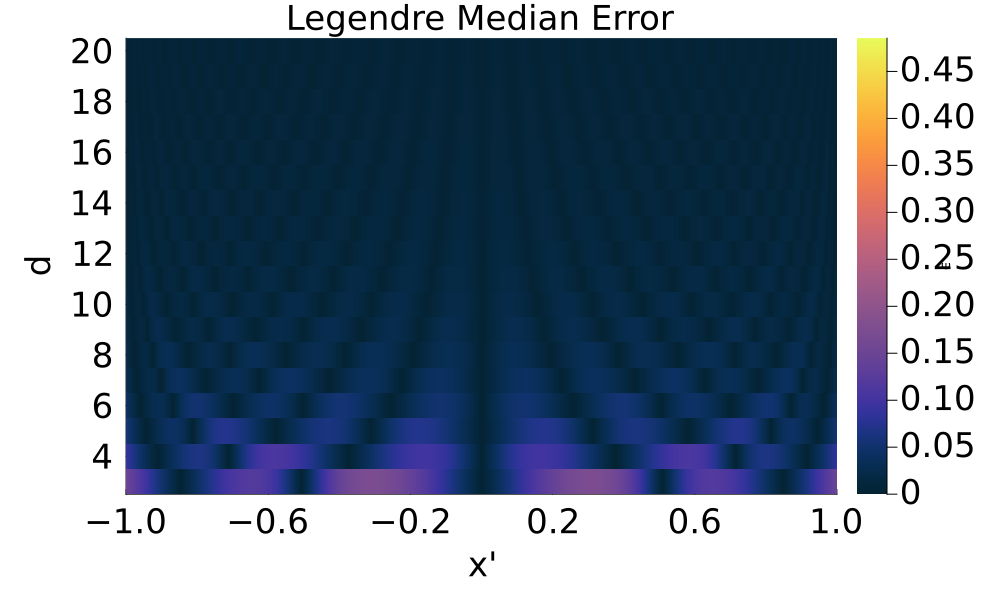

In [124]:
heatmap(xprs, collect(ds), err_matrix_median, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.4:1), title="Legendre Median Error",
        ylabel="d", xlabel="x'",
        xtickfont=fstyle, ytickfont=fstyle, 
        titlefont=fstyle, guidefont=fstyle,
        right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm,
        colorbar_title="ϵ")
#savefig("legendre_median_abs_error.svg")

# Hybrids

In [492]:
mean_mode_error_matrix = min.(err_matrix_mode, err_matrix);
mean_median_error_matrix = min.(err_matrix_median, err_matrix);
mode_median_error_matrix = min.(err_matrix_median, err_matrix_mode);

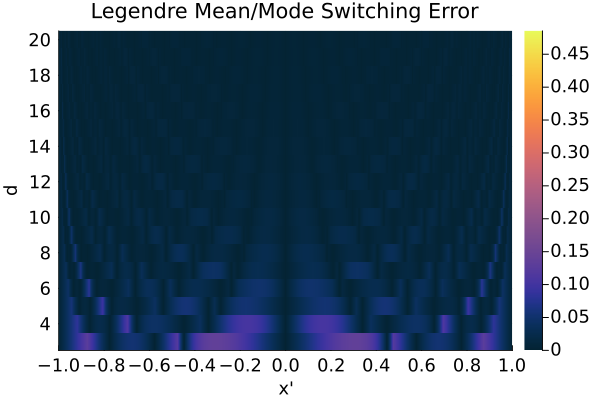

In [497]:
heatmap(xprs, collect(ds), mean_mode_error_matrix, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.2:1), title="Legendre Mean/Mode Switching Error",
        ylabel="d", xlabel="x'", 
        xtickfont=font(12), ytickfont=font(12), guidefont=font(12), right_margin=5mm)
#savefig("plots/legendre_meanmodeswitch_abs_error.svg")

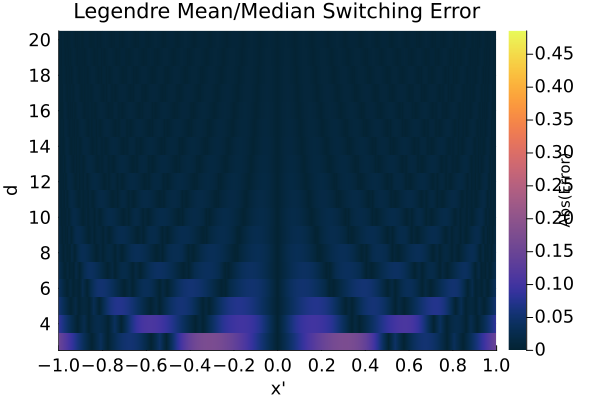

In [500]:
heatmap(xprs, collect(ds), mean_median_error_matrix, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.2:1), title="Legendre Mean/Median Switching Error",
        ylabel="d", xlabel="x'", colorbar_title="Abs(Error)",
        xtickfont=font(12), ytickfont=font(12), guidefont=font(12), right_margin=5mm)
#savefig("plots/legendre_meanmedianswitch_abs_error.svg")

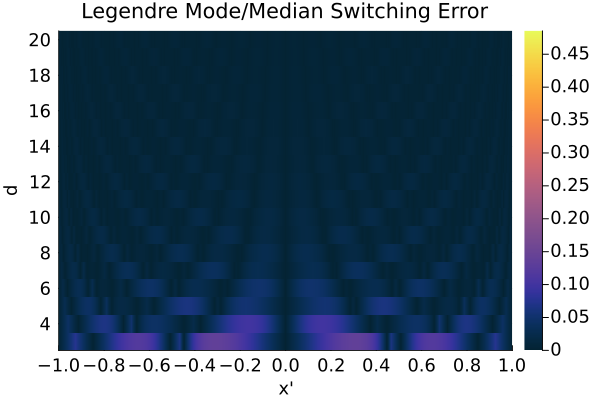

In [503]:
heatmap(xprs, collect(ds), mode_median_error_matrix, cmap=cmap, clim=(0, max_error),
    yticks=(collect(4:2:20)), xticks=(-1:0.2:1), title="Legendre Mode/Median Switching Error",
        ylabel="d", xlabel="x'",
        xtickfont=font(12), ytickfont=font(12), 
        guidefont=font(12), right_margin=5mm)
#savefig("legendre_modemedianswitch_abs_error.svg")

# Comparisons

#### Fixed d comparisons

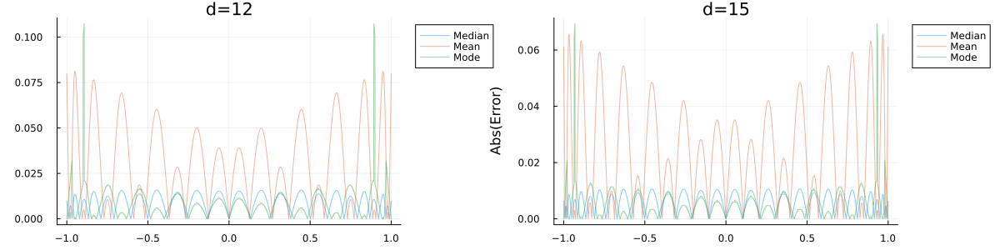

In [144]:
ylim_max = max.()
p1 = plot(xprs, err_matrix_median[10, :], title="d=$(ds[10])", label="Median", 
    legend=:outertopright, xlabel="x'", ylabel="Abs(Error)", alpha=0.5,
    )
plot!(xprs, err_matrix[10, :], label="Mean", alpha=0.5)
plot!(xprs, err_matrix_mode[10, :], label="Mode", alpha=0.5)

p2 = plot(xprs, err_matrix_median[13, :], title="d=$(ds[13])", label="Median", 
    legend=:outertopright, xlabel="x'", ylabel="Abs(Error)", alpha=0.5)
plot!(xprs, err_matrix[13, :], label="Mean", alpha=0.5)
plot!(xprs, err_matrix_mode[13, :], label="Mode", alpha=0.5)

p = plot(p1, p2, size=(1200, 300))

### Relative Errors

(1) Mean and Mode

In [179]:
mean_mode_rel_err_signed = (err_matrix_mode - err_matrix) ./ err_matrix

18×3000 Matrix{Float64}:
 -1.0  -0.997991  -0.995969  -0.993934  …  -0.995969  -0.997991  -1.0
 -1.0  -0.997313  -0.994596  -0.991846     -0.994596  -0.997313  -1.0
 -1.0  -0.996626  -0.993193  -0.989698     -0.993193  -0.996626  -1.0
 -1.0  -0.995927  -0.99175   -0.987466     -0.99175   -0.995927  -1.0
 -1.0  -0.995212  -0.990257  -0.985126     -0.990257  -0.995212  -1.0
 -1.0  -0.994475  -0.988697  -0.982648  …  -0.988697  -0.994475  -1.0
 -1.0  -0.993713  -0.987055  -0.979993     -0.987055  -0.993713  -1.0
 -1.0  -0.992917  -0.985309  -0.977116     -0.985309  -0.992917  -1.0
 -1.0  -0.99208   -0.983434  -0.973959     -0.983434  -0.99208   -1.0
 -1.0  -0.991193  -0.981399  -0.970444     -0.981399  -0.991193  -1.0
 -1.0  -0.990244  -0.979162  -0.966475  …  -0.979162  -0.990244  -1.0
 -1.0  -0.989219  -0.976674  -0.961915     -0.976674  -0.989219  -1.0
 -1.0  -0.988099  -0.973866  -0.956579     -0.973866  -0.988099  -1.0
 -1.0  -0.986862  -0.970648  -0.950202     -0.970648  -0.986862  

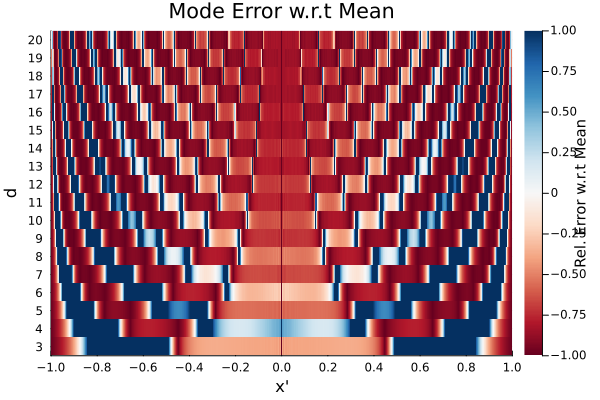

In [193]:
heatmap(xprs, collect(ds), mean_mode_rel_err_signed, cmap=cgrad(:RdBu), clim=(-1, 1),
    yticks=(collect(ds)), xticks=(-1:0.2:1), title="Mode Error w.r.t Mean",
        ylabel="d", xlabel="x'", colorbar_title="Rel. Error w.r.t Mean")
#savefig("mode_wrt_mean_rel_error.svg")

+ve = mean better, -ve = mode better

(2) Mean and Median

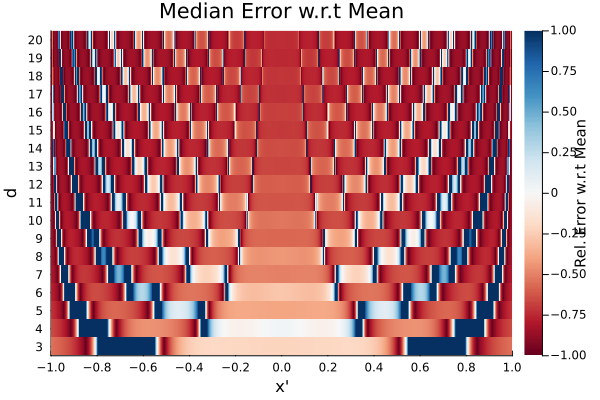

In [189]:
mean_median_rel_err_signed = (err_matrix_median - err_matrix) ./ err_matrix
heatmap(xprs, collect(ds), mean_median_rel_err_signed, cmap=cgrad(:RdBu), clim=(-1, 1),
    yticks=(collect(ds)), xticks=(-1:0.2:1), title="Median Error w.r.t Mean",
        ylabel="d", xlabel="x'", colorbar_title="Rel. Error w.r.t Mean")
#savefig("median_wrt_mean_rel_error.svg")

+ve = median better, -ve = mean better

(3) Median and Mode

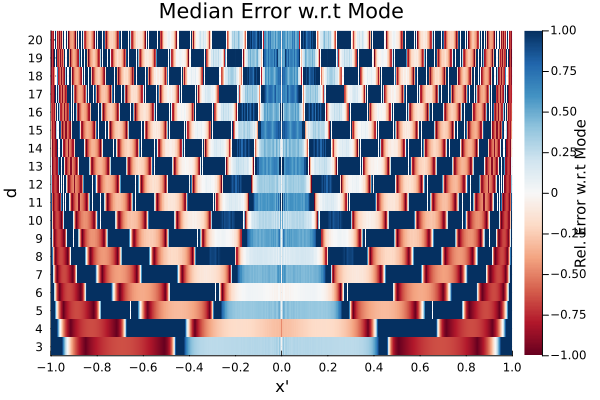

In [191]:
median_mode_rel_err_signed = (err_matrix_median - err_matrix_mode) ./ err_matrix_mode
heatmap(xprs, collect(ds), median_mode_rel_err_signed, cmap=cgrad(:RdBu), clim=(-1, 1),
    yticks=(collect(ds)), xticks=(-1:0.2:1), title="Median Error w.r.t Mode",
        ylabel="d", xlabel="x'", colorbar_title="Rel. Error w.r.t Mode")
#savefig("median_wrt_mode_rel_error.svg")

+ve = median better, -ve = mode better

### Abs. Errors

Direct comparison of mean, median, mode -> average and median uncertainty across encoding domain:

In [19]:
mean_avg_per_d = mean(err_matrix, dims=2) # avg over xprimes (columns)
mode_avg_per_d = mean(err_matrix_mode, dims=2)
median_avg_per_d = mean(err_matrix_median, dims=2);

mean_std_per_d = std(err_matrix, dims=2)
mode_std_per_d = std(err_matrix_mode, dims=2)
median_std_per_d = std(err_matrix_median, dims=2)

18×1 Matrix{Float64}:
 0.04961032216696509
 0.03113112776887507
 0.0213567020314228
 0.015607527673135727
 0.011938647643088123
 0.00945008807527669
 0.007681539768594169
 0.006377635290742284
 0.005386813407714066
 0.004615458964730927
 0.004002442636305675
 0.003506767446080436
 0.003100045144268694
 0.0027619439325863764
 0.002477318184006561
 0.0022362125689375408
 0.0020290606465781496
 0.0018501768547767765

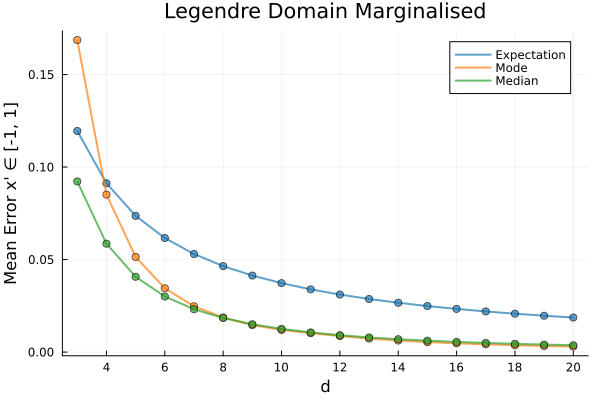

In [20]:
cpal = palette(:tab10)
plot(collect(ds), mean_avg_per_d, label="Expectation", lw=2, c=cpal[1], 
    xlabel="d", ylabel="Mean Error x' ∈ [-1, 1]", xticks=(2:2:20), 
    title="Legendre Domain Marginalised", alpha=0.7)
scatter!(collect(ds), mean_avg_per_d, label="", c=cpal[1], alpha=0.7)
plot!(collect(ds), mode_avg_per_d, label="Mode", lw=2, c=cpal[2], alpha=0.7)
scatter!(collect(ds), mode_avg_per_d, label="", c=cpal[2], alpha=0.7)
plot!(collect(ds), median_avg_per_d, label="Median", lw=2, c=cpal[3], alpha=0.7)
scatter!(collect(ds), median_avg_per_d, label="", c=cpal[3], alpha=0.7)
#savefig("legendre_single_stat_mean_domain_marg.svg")

In [17]:
mean_median_per_d = median(err_matrix, dims=2) # avg over xprimes (columns)
mode_median_per_d = median(err_matrix_mode, dims=2)
median_median_per_d = median(err_matrix_median, dims=2);

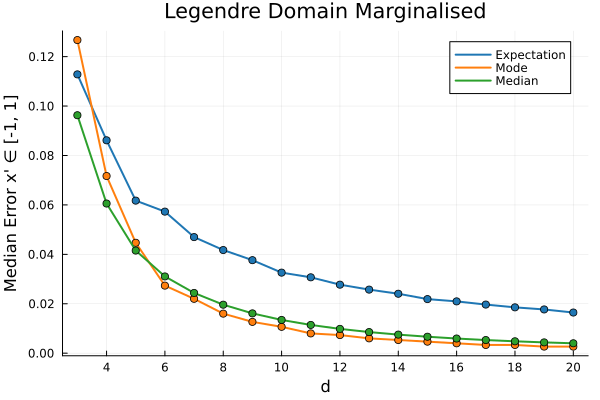

In [15]:
cpal = palette(:tab10)
plot(collect(ds), mean_median_per_d, label="Expectation", lw=2, c=cpal[1], 
    xlabel="d", ylabel="Median Error x' ∈ [-1, 1]", xticks=(2:2:20), 
    title="Legendre Domain Marginalised")
scatter!(collect(ds), mean_median_per_d, label="", c=cpal[1])
plot!(collect(ds), mode_median_per_d, label="Mode", lw=2, c=cpal[2])
scatter!(collect(ds), mode_median_per_d, label="", c=cpal[2])
plot!(collect(ds), median_median_per_d, label="Median", lw=2, c=cpal[3])
scatter!(collect(ds), median_median_per_d, label="", c=cpal[3])
#savefig("legendre_single_stat_median_domain_marg.svg")

## Distribution of Errors in Encoding Domain

d = 4

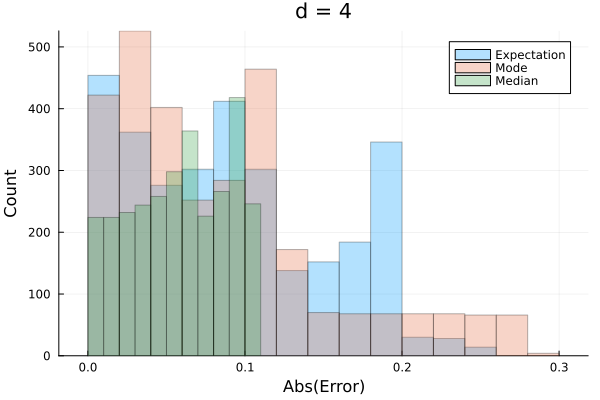

In [249]:
histogram(err_matrix[2, :], label="Expectation", xlabel="Abs(Error)", 
    ylabel="Count", alpha=0.3, title="d = 4")
histogram!(err_matrix_mode[2, :], label="Mode", alpha=0.3)
histogram!(err_matrix_median[2, :], label="Median", alpha=0.3)

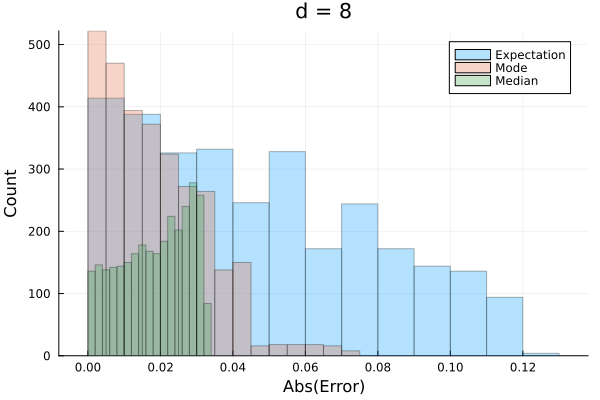

In [252]:
histogram(err_matrix[6, :], label="Expectation", xlabel="Abs(Error)", 
    ylabel="Count", alpha=0.3, title="d = $(ds[6])")
histogram!(err_matrix_mode[6, :], label="Mode", alpha=0.3)
histogram!(err_matrix_median[6, :], label="Median", alpha=0.3)

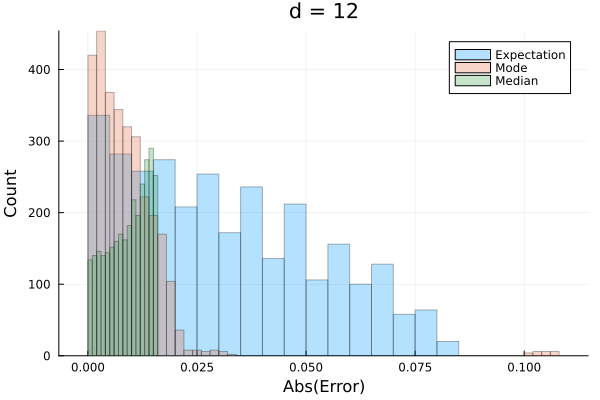

In [253]:
histogram(err_matrix[10, :], label="Expectation", xlabel="Abs(Error)", 
    ylabel="Count", alpha=0.3, title="d = $(ds[10])")
histogram!(err_matrix_mode[10, :], label="Mode", alpha=0.3)
histogram!(err_matrix_median[10, :], label="Median", alpha=0.3)

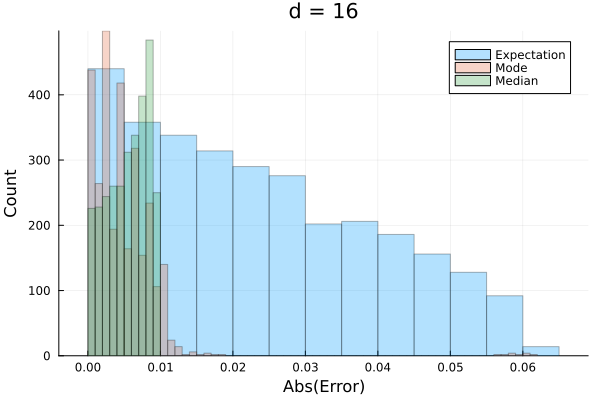

In [255]:
histogram(err_matrix[14, :], label="Expectation", xlabel="Abs(Error)", 
    ylabel="Count", alpha=0.3, title="d = $(ds[14])")
histogram!(err_matrix_mode[14, :], label="Mode", alpha=0.3)
histogram!(err_matrix_median[14, :], label="Median", alpha=0.3)

### Percentile

The question we are trying to answer here is what is the maximum error we can expect for the bulk of the encoding domain, disregarding the extreme outliers (spikes). This should give us a better sense of which single statistic to use, all things being equal. 

In [294]:
mean_percentile99 = [quantile(err_matrix[i, :], 0.99) for i in 1:size(err_matrix, 1)]
mode_percentile99 = [quantile(err_matrix_mode[i, :], 0.99) for i in 1:size(err_matrix_mode, 1)]
median_percentile99 = [quantile(err_matrix_median[i, :], 0.99) for i in 1:size(err_matrix_median, 1)]

18-element Vector{Float64}:
 0.1722835417363764
 0.10790029963039885
 0.07234750094772656
 0.05351860101788623
 0.0408664726497968
 0.03220083582215027
 0.026260763719323958
 0.021738865524059577
 0.01838122492070084
 0.01570364675697724
 0.013671413452352814
 0.011960724304866985
 0.01057017247759364
 0.009417395520939459
 0.008445378504220169
 0.007620654567417308
 0.006907245564423287
 0.006307498382392109

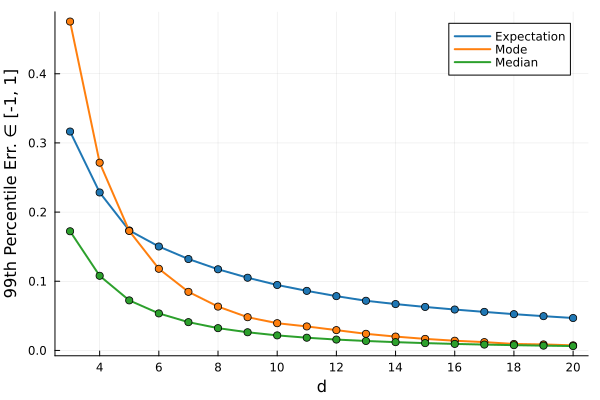

In [307]:
plot(collect(ds), mean_percentile99, label="Expectation", xlabel="d", 
    ylabel="99th Percentile Err. ∈ [-1, 1]", c=cpal[1], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), mean_percentile99, label="", c=cpal[1])
plot!(collect(ds), mode_percentile99, label="Mode", c=cpal[2],lw=2)
scatter!(collect(ds), mode_percentile99, label="", c=cpal[2])
plot!(collect(ds), median_percentile99, label="Median", c=cpal[3],lw=2)
scatter!(collect(ds), median_percentile99, label="", c=cpal[3])
#savefig("percentile99_comparison.svg")

In [47]:
fstyle = font("sans-serif", 23)

Plots.Font("sans-serif", 23, :hcenter, :vcenter, 0.0, RGB{N0f8}(0.0,0.0,0.0))

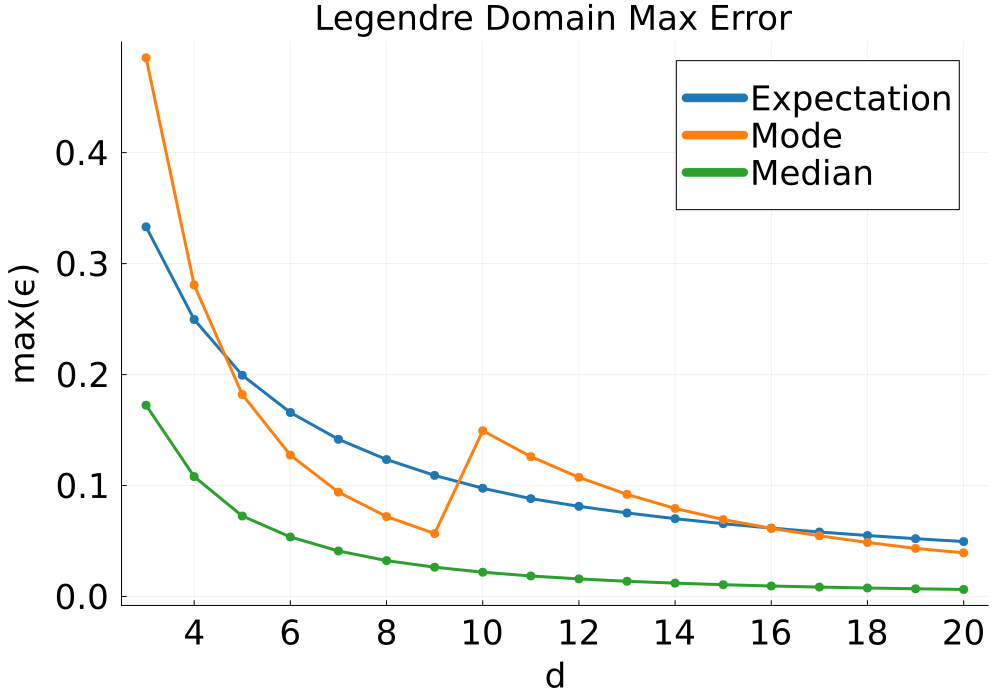

In [90]:
max_err_mean = maximum(err_matrix, dims=2)
max_err_mode = maximum(err_matrix_mode, dims=2)
max_err_median = maximum(err_matrix_median, dims=2)
plot(collect(ds), max_err_mean, label="Expectation", c=cpal[1], lw=3,
    xlabel="d", ylabel="max(ϵ)", xticks=(2:2:20), title="Legendre Domain Max Error",
    xtickfont=fstyle, ytickfont=fstyle, titlefont=fstyle, guidefont=fstyle,
    legendfont=fstyle, size=(1000, 700), left_margin=5mm, bottom_margin=5mm)
scatter!(collect(ds), max_err_mean, label="", c=cpal[1], markerstrokewidth=0, markersize=5)
plot!(collect(ds), max_err_mode, label="Mode", c=cpal[2], lw=3)
scatter!(collect(ds), max_err_mode, label="", c=cpal[2], markerstrokewidth=0, markersize=5)
plot!(collect(ds), max_err_median, label="Median", lw=3, c=cpal[3])
scatter!(collect(ds), max_err_median, label="", c=cpal[3], markerstrokewidth=0, markersize=5)
#savefig("domain_max_err_single_stat.svg")

# Hybrids

In [ ]:
mean_mode_error_matrix = min.(err_matrix_mode, err_matrix);
mean_median_error_matrix = min.(err_matrix_median, err_matrix);
mode_median_error_matrix = min.(err_matrix_median, err_matrix_mode);

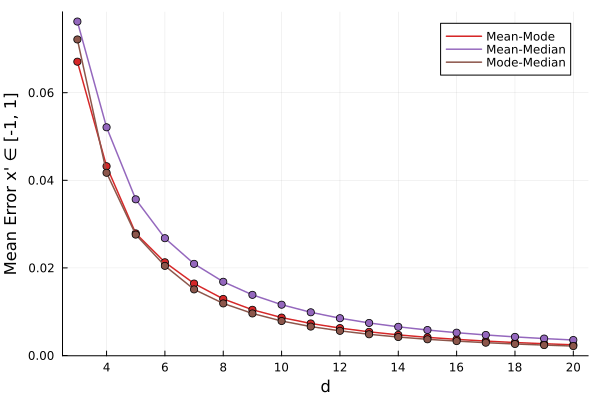

In [409]:
mean_mean_mode_error = mean(mean_mode_error_matrix, dims=2)
mean_mean_median_error = mean(mean_median_error_matrix, dims=2)
mean_mode_median_error = mean(mode_median_error_matrix, dims=2);


std_mean_mode_error = std(mean_mode_error_matrix, dims=2)
std_mean_median_error = std(mean_median_error_matrix, dims=2)
std_mode_median_error = std(mode_median_error_matrix, dims=2)
plot(collect(ds), mean_mean_mode_error, label="Mean-Mode", c=cpal[4], lw=1.5, 
    xlabel="d", ylabel="Mean Error x' ∈ [-1, 1]", xticks=(2:2:20))
scatter!(collect(ds), mean_mean_mode_error, label="", c=cpal[4])
plot!(collect(ds), mean_mean_median_error, label="Mean-Median", c=cpal[5], lw=1.5)
scatter!(collect(ds), mean_mean_median_error, label="", c=cpal[5])
plot!(collect(ds), mean_mode_median_error, label="Mode-Median", c=cpal[6],lw=1.5)
scatter!(collect(ds), mean_mode_median_error, label="", c=cpal[6])
#savefig("hybrid_mean_domain.svg")

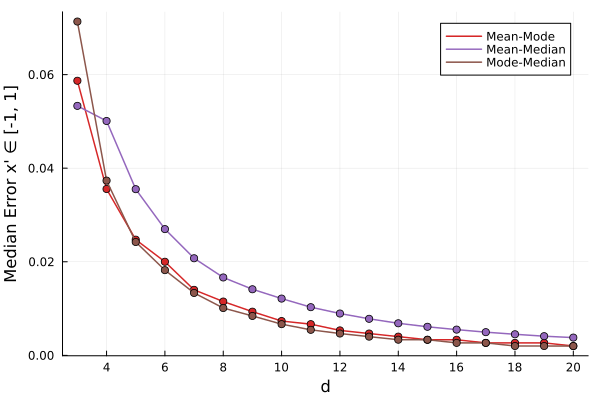

In [372]:
median_mean_mode_error = median(mean_mode_error_matrix, dims=2)
median_mean_median_error = median(mean_median_error_matrix, dims=2)
median_mode_median_error = median(mode_median_error_matrix, dims=2);
plot(collect(ds), median_mean_mode_error, label="Mean-Mode", c=cpal[4], lw=1.5, 
    xlabel="d", ylabel="Median Error x' ∈ [-1, 1]", xticks=(2:2:20))
scatter!(collect(ds), median_mean_mode_error, label="", c=cpal[4])
plot!(collect(ds), median_mean_median_error, label="Mean-Median", c=cpal[5], lw=1.5)
scatter!(collect(ds), median_mean_median_error, label="", c=cpal[5])
plot!(collect(ds), median_mode_median_error, label="Mode-Median", c=cpal[6],lw=1.5)
scatter!(collect(ds), median_mode_median_error, label="", c=cpal[6])
#savefig("hybrid_median_domain.svg")

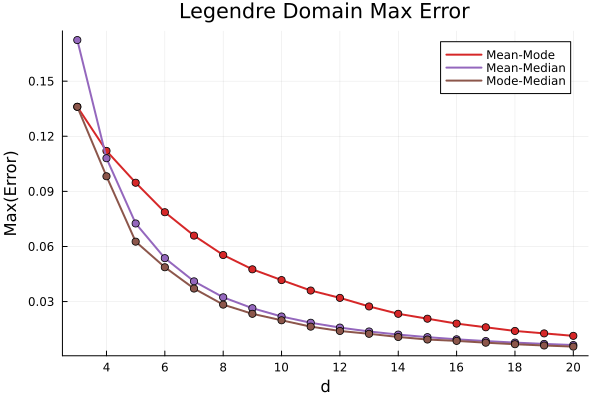

In [374]:
max_err_mean_mode = maximum(mean_mode_error_matrix, dims=2)
max_err_mean_median = maximum(mean_median_error_matrix, dims=2)
max_err_median_mode = maximum(mode_median_error_matrix, dims=2)
plot(collect(ds), max_err_mean_mode, label="Mean-Mode", c=cpal[4], lw=2,
    xlabel="d", ylabel="Max(Error)", xticks=(2:2:20), title="Legendre Domain Max Error")
scatter!(collect(ds), max_err_mean_mode, label="", c=cpal[4])
plot!(collect(ds), max_err_mean_median, label="Mean-Median", c=cpal[5], lw=2)
scatter!(collect(ds), max_err_mean_median, label="", c=cpal[5])
plot!(collect(ds), max_err_median_mode, label="Mode-Median", lw=2, c=cpal[6])
scatter!(collect(ds), max_err_median_mode, label="", c=cpal[6])
#savefig("hybrid_max_domain.svg")

In [366]:
mean_mode_percentile99 = [quantile(mean_mode_error_matrix[i, :], 0.99) for i in 1:size(mean_mode_error_matrix, 1)]
mean_median_percentile99 = [quantile(mean_median_error_matrix[i, :], 0.99) for i in 1:size(mean_median_error_matrix, 1)]
mode_median_percentile99 = [quantile(mode_median_error_matrix[i, :], 0.99) for i in 1:size(mode_median_error_matrix, 1)]

18-element Vector{Float64}:
 0.13538512837612562
 0.09812026312931742
 0.06250765166499968
 0.0486828942980993
 0.0369802755208302
 0.02820483221915783
 0.02334111370456826
 0.019685775514991594
 0.016213572204700915
 0.01400466822274088
 0.012305543817032126
 0.010569275863822974
 0.009336445481827216
 0.00819094434266725
 0.007335778592864273
 0.006668889629876773
 0.006002000666889051
 0.00533511170390133

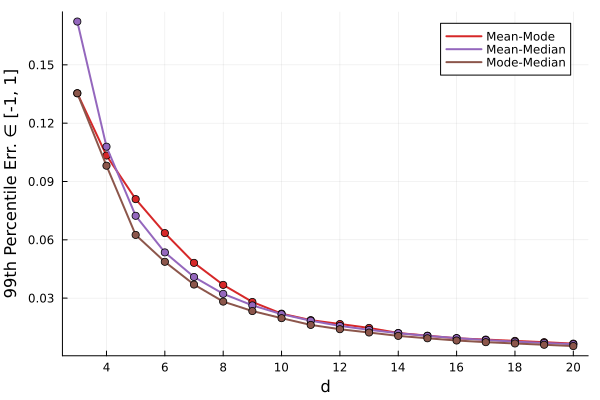

In [376]:
plot(collect(ds), mean_mode_percentile99, label="Mean-Mode", xlabel="d", 
    ylabel="99th Percentile Err. ∈ [-1, 1]", c=cpal[4], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), mean_mode_percentile99, label="", c=cpal[4])
plot!(collect(ds), mean_median_percentile99, label="Mean-Median", c=cpal[5],lw=2)
scatter!(collect(ds), mean_median_percentile99, label="", c=cpal[5])
plot!(collect(ds), mode_median_percentile99, label="Mode-Median", c=cpal[6],lw=2)
scatter!(collect(ds), mode_median_percentile99, label="", c=cpal[6])
#savefig("hybrid_percentile99_domain.svg")

Mode-Median vs Median only

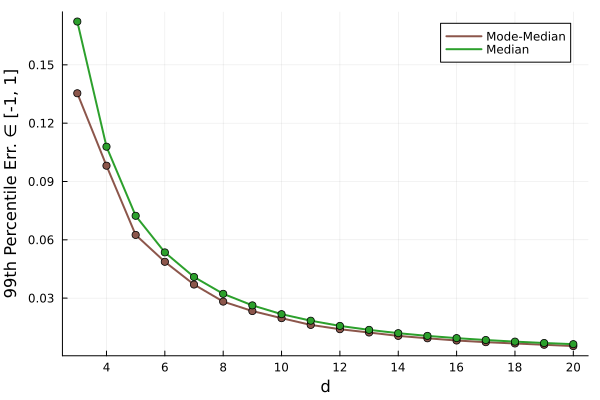

In [387]:
plot(collect(ds), mode_median_percentile99, label="Mode-Median", xlabel="d", 
    ylabel="99th Percentile Err. ∈ [-1, 1]", c=cpal[6], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), mode_median_percentile99, label="", c=cpal[6])
plot!(collect(ds), median_percentile99, label="Median", c=cpal[3],lw=2)
scatter!(collect(ds), median_percentile99, label="", c=cpal[3])
#savefig("hybrid_single_compare_percentile99.svg")

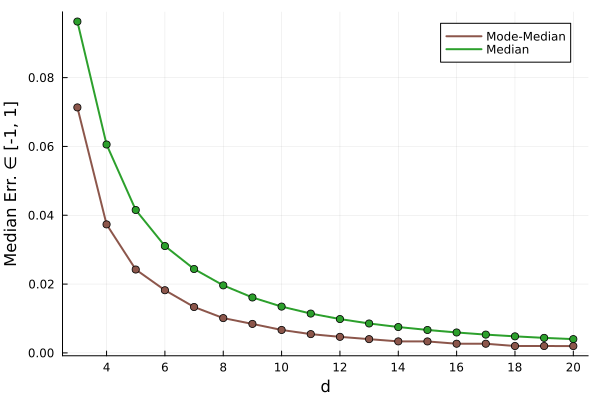

In [389]:
plot(collect(ds), median_mode_median_error, label="Mode-Median", xlabel="d", 
    ylabel="Median Err. ∈ [-1, 1]", c=cpal[6], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), median_mode_median_error, label="", c=cpal[6])
plot!(collect(ds), median_median_per_d, label="Median", c=cpal[3],lw=2)
scatter!(collect(ds), median_median_per_d, label="", c=cpal[3])
#savefig("hybrid_single_compare_median.svg")

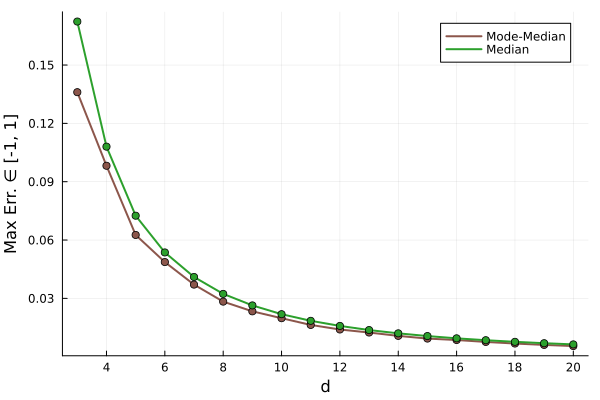

In [391]:
plot(collect(ds), max_err_median_mode, label="Mode-Median", xlabel="d", 
    ylabel="Max Err. ∈ [-1, 1]", c=cpal[6], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), max_err_median_mode, label="", c=cpal[6])
plot!(collect(ds), max_err_median, label="Median", c=cpal[3],lw=2)
scatter!(collect(ds), max_err_median, label="", c=cpal[3])
#savefig("hybrid_single_compare_max.svg")

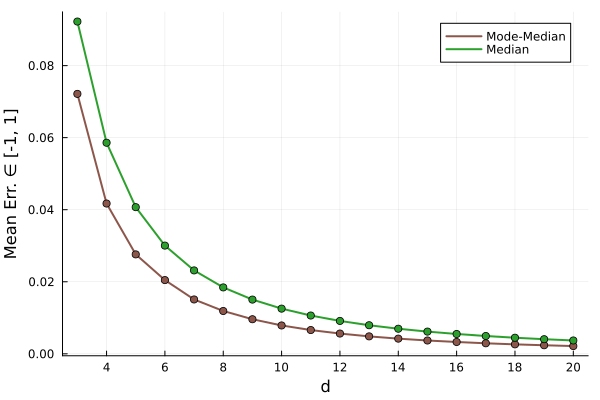

In [393]:
plot(collect(ds), mean_mode_median_error, label="Mode-Median", xlabel="d", 
    ylabel="Mean Err. ∈ [-1, 1]", c=cpal[6], lw=2,
        xticks=(2:2:20))
scatter!(collect(ds), mean_mode_median_error, label="", c=cpal[6])
plot!(collect(ds), median_avg_per_d, label="Median", c=cpal[3],lw=2)
scatter!(collect(ds), median_avg_per_d, label="", c=cpal[3])
#savefig("hybrid_single_compare_mean.svg")

Mode, Mean-Mode

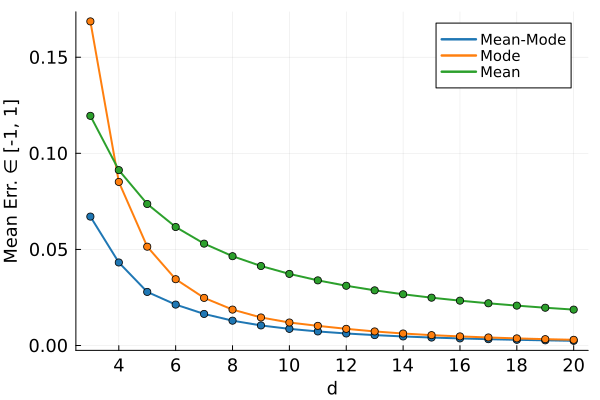

In [610]:
plot(collect(ds), mean_mean_mode_error, label="Mean-Mode", xlabel="d", 
    ylabel="Mean Err. ∈ [-1, 1]", c=cpal[1], lw=2,
        xticks=(2:2:20), xtickfont=font(12), ytickfont=font(12),
        guidefont=font(12), legendfont=font(10),)
scatter!(collect(ds), mean_mean_mode_error, label="", c=cpal[1])
plot!(collect(ds), mode_avg_per_d, label="Mode", c=cpal[2],lw=2)
scatter!(collect(ds), mode_avg_per_d, label="", c=cpal[2])
plot!(collect(ds), mean_avg_per_d, label="Mean", c=cpal[3], lw=2)
scatter!(collect(ds), mean_avg_per_d, label="", c=cpal[3])
#savefig("compare_mean_mode_meanmode_avg_domain_err.svg")

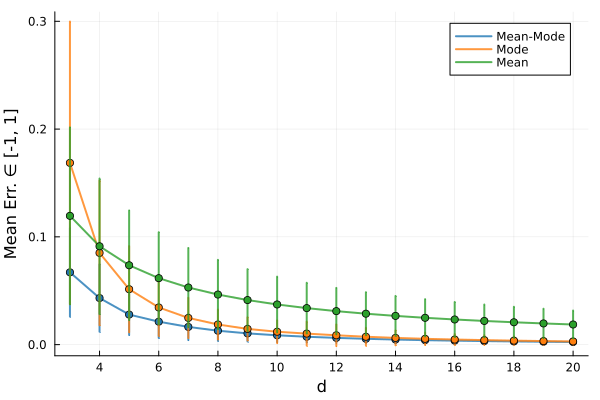

In [619]:
plot(collect(ds), mean_mean_mode_error, label="Mean-Mode", xlabel="d", 
    ylabel="Mean Err. ∈ [-1, 1]", c=cpal[1], lw=2, msc=cpal[1],
        xticks=(2:2:20), yerr=std_mean_mode_error, alpha=0.8, ms=0)
scatter!(collect(ds), mean_mean_mode_error, label="", c=cpal[1])
plot!(collect(ds), mode_avg_per_d, label="Mode", c=cpal[2],lw=2, yerr=mode_std_per_d, 
    msc=cpal[2], alpha=0.8, ms=0)
scatter!(collect(ds), mode_avg_per_d, label="", c=cpal[2])
plot!(collect(ds), mean_avg_per_d, label="Mean", c=cpal[3], lw=2, 
    yerr=mean_std_per_d, msc=cpal[3], alpha=0.8, ms=0)
scatter!(collect(ds), mean_avg_per_d, label="", c=cpal[3])

In [659]:
d_indices = [2, 6, 10, 14, 18]  # Indices for different `d`
d_labels = ["d=$(ds[2])", "d=$(ds[6])", "d=$(ds[10])", "d=$(ds[14])", "d=$(ds[end])"]

# Flatten the data for grouping
grouped_data = vcat(
    err_matrix_mode[d_indices, :], 
    err_matrix[d_indices, :], 
    mean_mode_error_matrix[d_indices, :]
)

# Group labels (repeat class labels for each `d`)
group_labels = repeat(["Class $(i)" for i in 1:5], length(grouped_data))

# Box plot with grouping
#boxplot(grouped_data, group=group_labels, label=false, legend=:topright, bar_width=0.3)


225000-element Vector{String}:
 "Class 1"
 "Class 2"
 "Class 3"
 "Class 4"
 "Class 5"
 "Class 1"
 "Class 2"
 "Class 3"
 "Class 4"
 "Class 5"
 ⋮
 "Class 2"
 "Class 3"
 "Class 4"
 "Class 5"
 "Class 1"
 "Class 2"
 "Class 3"
 "Class 4"
 "Class 5"

In [626]:
err_matrix_mode[1,:]

3000-element Vector{Float64}:
 0.0
 0.0006668889629877217
 0.0013337779259752214
 0.002000666888962943
 0.002667555851950665
 0.0033344448149383865
 0.004001333777925886
 0.004668222740913608
 0.00533511170390133
 0.006002000666889051
 ⋮
 0.00533511170390133
 0.004668222740913608
 0.004001333777925886
 0.0033344448149383865
 0.002667555851950665
 0.002000666888962943
 0.0013337779259752214
 0.0006668889629877217
 0.0

Mode proportion of high error vals (> 0.01) as a function of d:

In [516]:
props_mode = [sum(err_matrix_mode[i,:] .> 0.01)/size(err_matrix_mode, 2) for i in 1:size(err_matrix_mode, 1)];
props_mean = [sum(err_matrix[i,:] .> 0.01)/size(err_matrix, 2) for i in 1:size(err_matrix, 1)];
props_mean_mode = [sum(mean_mode_error_matrix[i,:] .> 0.01)/size(mean_mode_error_matrix, 2) for i in 1:size(mean_mode_error_matrix, 1)];

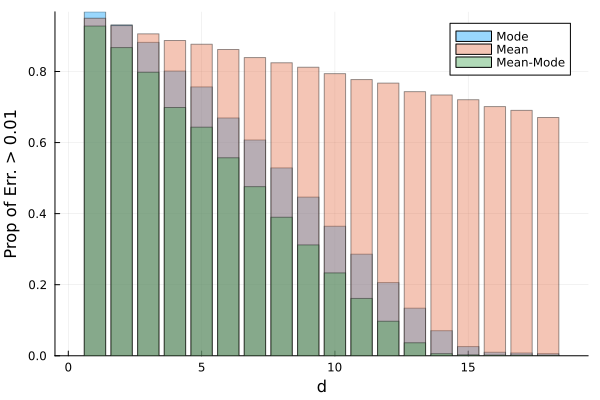

In [519]:
bar(props_mode, alpha=0.4, label="Mode", xlabel="d", ylabel="Prop of Err. > 0.01")
bar!(props_mean, alpha=0.4, label="Mean")
bar!(props_mean_mode, alpha=0.4, label="Mean-Mode")

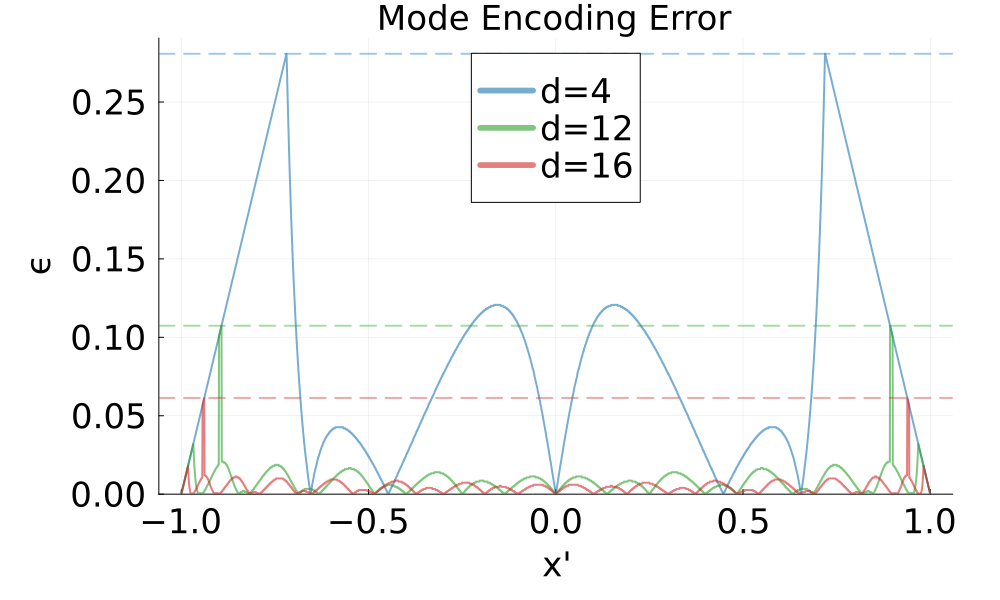

In [134]:
ylim_max = maximum(err_matrix_mode[2, :]) + 0.01
plot(xprs, err_matrix_mode[2,:], xlabel="x'", ylabel="ϵ", 
    label="d=$(ds[2])", legend=:top, c=cpal[1], lw=2, alpha=0.6, 
    title="Mode Encoding Error", xtickfont=fstyle, ytickfont=fstyle, 
    titlefont=fstyle, guidefont=fstyle, legendfont=fstyle,
    right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm,ylims=(0, ylim_max))
hline!([maximum(err_matrix_mode[2, :])], ls=:dash, c=cpal[1], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix_mode[10, :], label="d=$(ds[10])", c=cpal[3], lw=2, alpha=0.6)
hline!([maximum(err_matrix_mode[10, :])], ls=:dash, c=cpal[3], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix_mode[14, :], label="d=$(ds[14])", c=cpal[4], lw=2, alpha=0.6)
hline!([maximum(err_matrix_mode[14, :])], ls=:dash, c=cpal[4], lw=2, label="", alpha=0.4)
#avefig("plots/mode_enc_error_d_slices.svg")

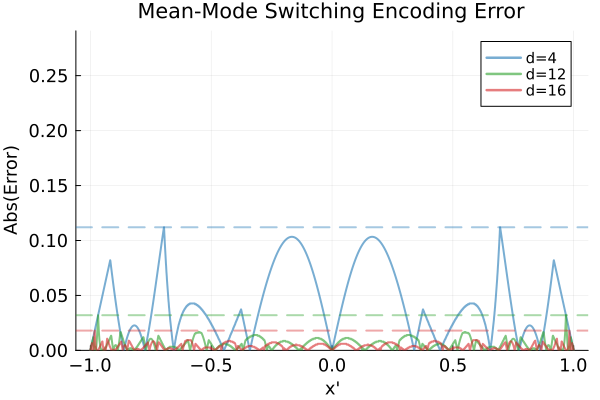

In [680]:
plot(xprs, mean_mode_error_matrix[2,:], xlabel="x'", ylabel="Abs(Error)", 
    label="d=$(ds[2])", c=cpal[1], lw=2, alpha=0.6, 
    title="Mean-Mode Switching Encoding Error", xtickfont=font(12), ytickfont=font(12),
    guidefont=font(12), legendfont=font(10), ylims=(0, ylim_max))
hline!([maximum(mean_mode_error_matrix[2, :])], ls=:dash, c=cpal[1], lw=2, label="", alpha=0.4)
plot!(xprs, mean_mode_error_matrix[10, :], label="d=$(ds[10])", c=cpal[3], lw=2, alpha=0.6)
hline!([maximum(mean_mode_error_matrix[10, :])], ls=:dash, c=cpal[3], lw=2, label="", alpha=0.4)
plot!(xprs, mean_mode_error_matrix[14, :], label="d=$(ds[14])", c=cpal[4], lw=2, alpha=0.6)
hline!([maximum(mean_mode_error_matrix[14, :])], ls=:dash, c=cpal[4], lw=2, label="", alpha=0.4)
#savefig("plots/meanmode_enc_error_d_slices.svg")

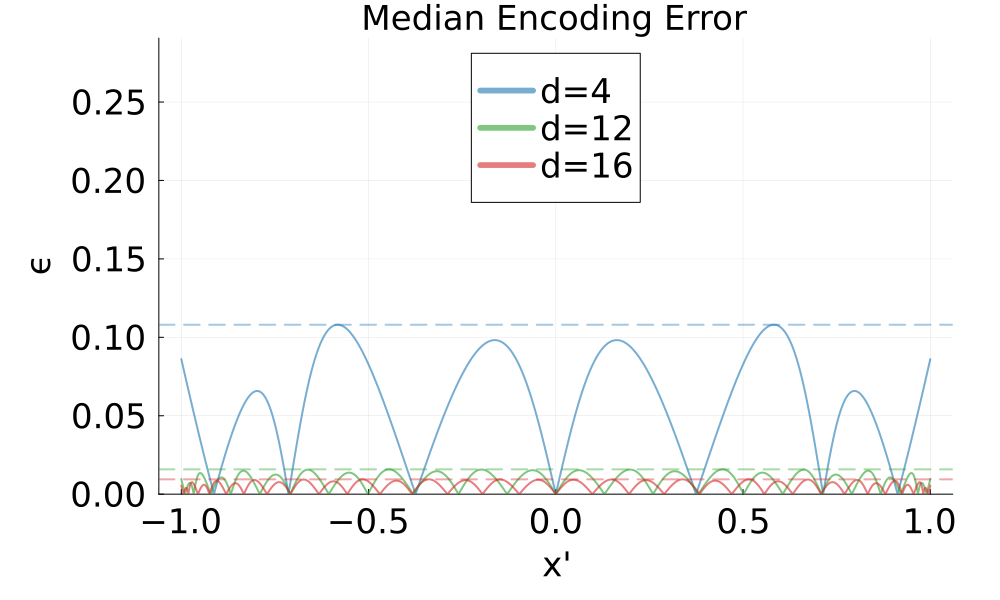

In [142]:
plot(xprs, err_matrix_median[2,:], xlabel="x'", ylabel="ϵ", 
    label="d=$(ds[2])", c=cpal[1], lw=2, alpha=0.6, 
    title="Median Encoding Error", xtickfont=fstyle, ytickfont=fstyle, 
    titlefont=fstyle, guidefont=fstyle, legendfont=fstyle,
    right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm, ylims=(0, ylim_max),
    legend=:top)
hline!([maximum(err_matrix_median[2, :])], ls=:dash, c=cpal[1], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix_median[10, :], label="d=$(ds[10])", c=cpal[3], lw=2, alpha=0.6)
hline!([maximum(err_matrix_median[10, :])], ls=:dash, c=cpal[3], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix_median[14, :], label="d=$(ds[14])", c=cpal[4], lw=2, alpha=0.6)
hline!([maximum(err_matrix_median[14, :])], ls=:dash, c=cpal[4], lw=2, label="", alpha=0.4)
#savefig("plots/median_enc_error_d_slices.svg")

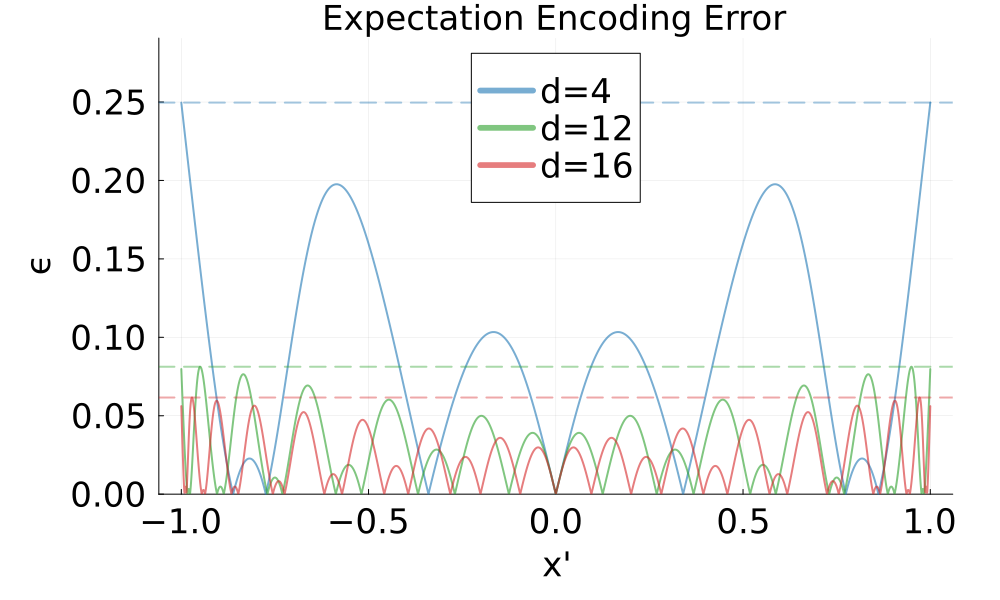

In [148]:
plot(xprs, err_matrix[2,:], xlabel="x'", ylabel="ϵ", 
    label="d=$(ds[2])", c=cpal[1], lw=2, alpha=0.6, 
    title="Expectation Encoding Error", xtickfont=fstyle, ytickfont=fstyle, 
    titlefont=fstyle, guidefont=fstyle, legendfont=fstyle,
    right_margin=10mm, size=(1000, 600), left_margin=10mm, bottom_margin=10mm,
    ylims=(0, ylim_max), legend=:top)
hline!([maximum(err_matrix[2, :])], ls=:dash, c=cpal[1], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix[10, :], label="d=$(ds[10])", c=cpal[3], lw=2, alpha=0.6)
hline!([maximum(err_matrix[10, :])], ls=:dash, c=cpal[3], lw=2, label="", alpha=0.4)
plot!(xprs, err_matrix[14, :], label="d=$(ds[14])", c=cpal[4], lw=2, alpha=0.6)
hline!([maximum(err_matrix[14, :])], ls=:dash, c=cpal[4], lw=2, label="", alpha=0.4)
#savefig("plots/expectation_enc_error_d_slices.svg")